In [1]:
utf8::utf8_print('\U0001f6a7 work in progress \U0001f6a7')

[1] "🚧​ work in progress 🚧​"


# Study of the synonymous mutations

Created: **19/07/18**  
Last modified: **17/08/18**

**Goal:** this study will focus only on the `synonymous_SNV` mutations, trying first to filter the non-somatic synonymous mutations and then to study the reccurent synonymous mutations. This notebook follows the methodology of the `coding_mutations_analysis.ipynb` notebook. The [`/synonymous_mutations_analysis_extra`](https://github.com/ElsaB/impact-annotator/blob/master/analysis/description/180731_pierre/synonymous_mutations_analysis_extra) folder contains extra material detailed in this notebook for the study of the `synonymous_SNV` mutations. 
This notebook is divided in two parts:
* **1. The `type` feature: coding_somatic vs synonymous**: introduce a new feature to class the mutations as coding_somatic or synonymous. The idea is to filter the set of synonymous mutations by comparing their parameters to a set of known somatic mutations parameters.
* **2. The `mut_key` feature: study of reccurent mutations**: study the reccurence of synonymous mutations, study the outliers with a high reccurence.
* **3. Summary**

**Refs:**
* `coding_mutations_analysis.ipynb`

***

In [2]:
source("../../../src/utils/custom_tools.R")
setup_environment("../../../src/utils")

Warning message:
“package ‘dplyr’ was built under R version 3.5.1”

In [3]:
impact <- read.table("../../../data/cleaned_IMPACT_mutations_180508.txt",
                     sep = "\t", stringsAsFactors = FALSE, header = TRUE)
impact <- add_features("../../../data", impact,
                       annotations = TRUE, oncokb = TRUE, gene_type = TRUE, keys_annotations = TRUE)

## The `type` feature: coding_somatic vs synonymous

The `synonymous_SNV` mutations have automatically been classified as `UNKNOWN` so we don't know which one are somatic or non-somatic mutations. However, the coding mutations have been curated, and we know which one of them are somatic. Thus, we can take the somatic coding mutations as a reference of mutations that are somatic. For example, comparing the `frequency_in_normals` for `synonymous_SNV` mutations and somatic coding mutations could reveal a difference and help us to filter the `synonymous_SNV` mutations that are somatic from the one that are non-somatic.  

Unfortunately, this study will show that the `frequency_in_normals`, `t_vaf` and `strand_bias` features won't be relevant to filter the `synonymous_SNV` mutations. However, the `Kaviar_AF` feature could help us!

### Creating the feature

We create a new feature `type`:
* A mutation has `type = synonymous` if `Consequence = synonymous_SNV`
* A mutation has `type = coding_somatic` if it is a coding mutation and `confidence_class = AUTO_OK | MANUAL_OK`.

In [4]:
impact <- impact[(impact$Consequence == "synonymous_SNV") |
                 (impact$Consequence != "synonymous_SNV" & (impact$confidence_class == "AUTO_OK" |
                                                            impact$confidence_class == "MANUAL_OK")),]
impact$type <- "coding_somatic"
impact$type[(impact$Consequence == "synonymous_SNV")] <- "synonymous"

addmargins(table(impact$type, impact$confidence_class), margin = 2)
100 * nrow(impact[impact$type == "synonymous",]) / nrow(impact) # percentage of synonymous mutations

,AUTO_OK,MANUAL_OK,UNKNOWN,Sum
coding_somatic,180733,6335,0,187068
synonymous,0,0,50005,50005


[1] 21.09266

The dataset is unbalanced with 50,010 synonymous mutations ($21.1\%$ of the samples) vs 187,098 somatic mutations ($78.9\%$ of the samples).

### Comparison of the `frequency_in_normals`, `t_vaf` and `strand_ratio`

We create the `strand_ratio` feature:

In [5]:
impact$strand_ratio <- pmin(impact$t_alt_neg_count, impact$t_alt_plus_count) /
                       pmax(impact$t_alt_neg_count, impact$t_alt_plus_count)

Distribution of `frequency_in_normals`, `tvaf` and `strand_ratio` for the coding vs synonymous `type` (warning the first and last plot have a sqrt x and sqrt y scale):

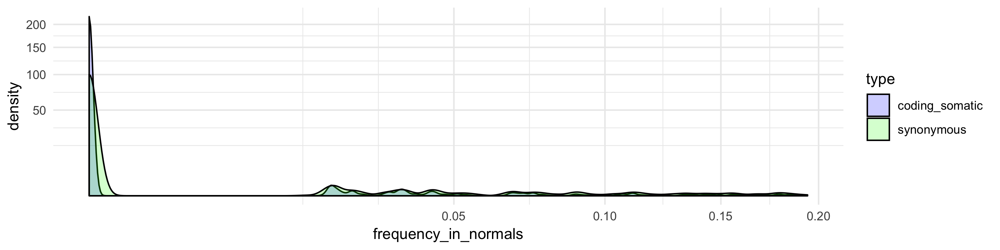

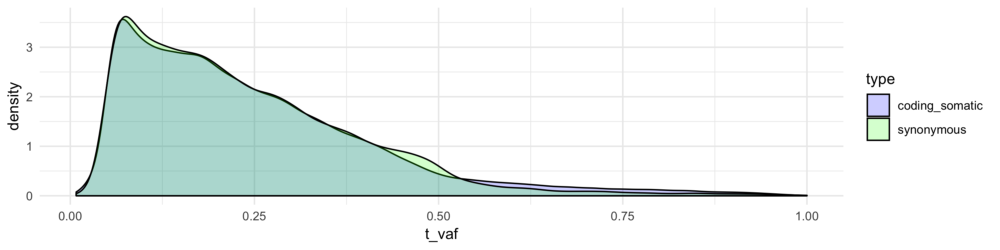

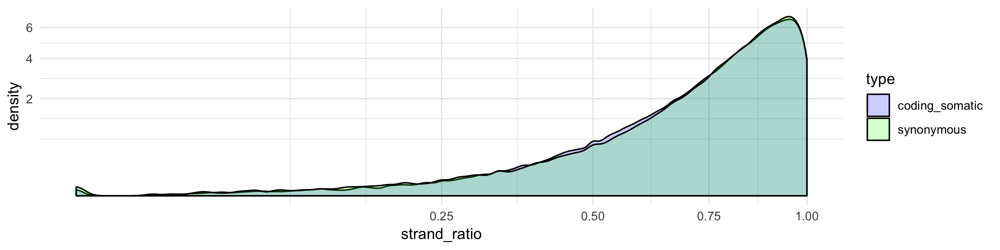

In [6]:
plot_density(impact, "frequency_in_normals", "type", height = 2.5) + scale_x_sqrt() + scale_y_sqrt()
plot_density(impact, "t_vaf", "type", height = 2.5)
plot_density(impact, "strand_ratio", "type", height = 2.5) + scale_x_sqrt() + scale_y_sqrt()

The distributions are almost identical in every plot. Wee see a little bump at `t_vaf` $\approx 0.5$ for the synonymous mutations, most likely the germline part of it but it is really not pronounced.

Below is an attempt to plot the `strand_ratio` vs the `t_vaf` to separate the germline (`t_vaf` $\approx 0.5$ and high `strand_ratio`) from the artefact (low `t_vaf` and low `strand_ratio`), but nothing really discriminant was found.

Warning message:
“Computation failed in `stat_binhex()`:
Package `hexbin` required for `stat_binhex`.
Please install and try again.”Warning message:
“Computation failed in `stat_binhex()`:
Package `hexbin` required for `stat_binhex`.
Please install and try again.”

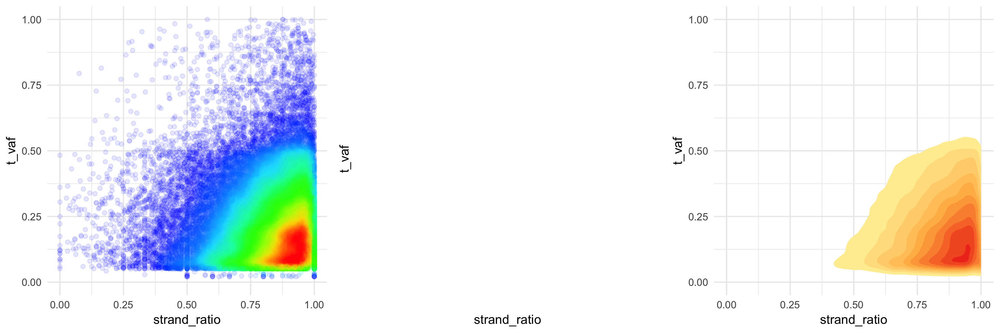

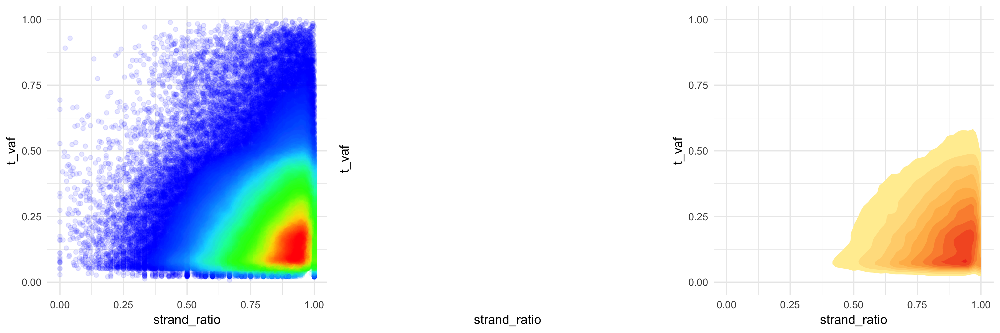

In [7]:
plot_density_2d(impact[impact$type == "synonymous",], "strand_ratio", "t_vaf",
                to_add = coord_cartesian(xlim = c(0,1), ylim = c(0,1)))
plot_density_2d(impact[impact$type == "coding_somatic",], "strand_ratio", "t_vaf",
                to_add = coord_cartesian(xlim = c(0,1), ylim = c(0,1)))

### Comparison of `Kaviar_AF`

Distribution of `Kaviar_AF` for the coding vs synonymous `type` (warning this is a sqrt x and sqrt y scale and this plot concerns only the non-null `Kaviar_AF` ie 26.64% of the data):

[1] "63157 over 237073 (26.64%)"

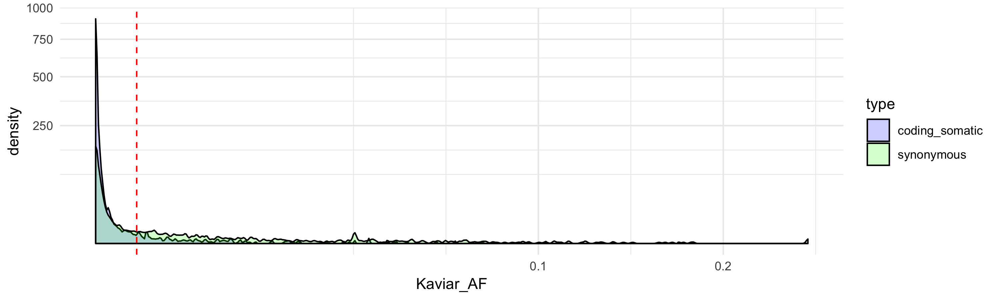

In [8]:
print_count_and_proportion(nrow(impact[impact$Kaviar_AF != 0,]), nrow(impact))
plot_density(impact[impact$Kaviar_AF != 0,], "Kaviar_AF", "type", lines = 0.001) + scale_x_sqrt() + scale_y_sqrt()

The synonymous mutations present a heavier `Kaviar_AF` tail, which are likely to be the artefacts call.

In [9]:
summary(impact[impact$type == "coding_somatic",]$Kaviar_AF)

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.000e+00 0.000e+00 0.000e+00 2.594e-05 0.000e+00 1.730e-01 

In [10]:
summary(impact[impact$type == "synonymous",]$Kaviar_AF)

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.0000000 0.0000000 0.0000000 0.0005997 0.0000065 0.2572410 

In [11]:
100 * nrow(impact[impact$type == "coding_somatic" &
                  impact$Kaviar_AF > 0.001,]) / nrow(impact[impact$type == "coding_somatic",])
100 * nrow(impact[impact$type == "synonymous" &
                  impact$Kaviar_AF > 0.001,]) / nrow(impact[impact$type == "synonymous",])

[1] 0.2747664

[1] 4.173583

We are going to set a threshold on the `Kaviar_AF` parameter to try to curate the `synonymous` mutations, even if the threshold is a bit severe and will loose some somatic synonymous, we should still be able to work on a sufficient amount of `synonymous` mutations. The threshold will be set at 0.001 (see red line on the plot above).

In [12]:
impact <- impact[impact$type != "synonymous" |
                 (impact$type == "synonymous" & impact$Kaviar_AF <= 0.001),]

### Comparison of `cosmic_count`

Distribution of `cosmic_count` for the coding vs synonymous `albel` (warning this is a sqrt x and sqrt y scale and this plot concerns only the non-null `cosmic_count` ie 21,88% of the data):

[1] "51598 over 234986 (21.96%)"

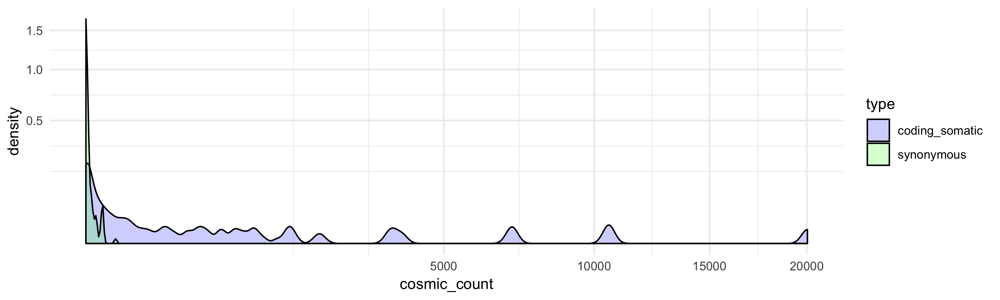

In [13]:
print_count_and_proportion(nrow(impact[impact$cosmic_count != 0,]), nrow(impact))
plot_density(impact[impact$cosmic_count != 0,], "cosmic_count", "type") + scale_x_sqrt() + scale_y_sqrt()

As expected the `synonymous` mutations have a really low `cosmic_count`.

In [14]:
summary(impact[impact$type == "synonymous",]$cosmic_count)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.1262  0.0000 46.0000 

However, some of the synonymous mutations have an unexpectedly high `cosmic_count`:

In [15]:
impact[impact$type == "synonymous",] %>% group_by(mut_key) %>%
                                          filter(cosmic_count > 10) %>%
                                          summarise(cosmic_count = unique(cosmic_count),
                                                    Hugo_Symbol = unique(Hugo_Symbol),
                                                    HGVSp_Short = unique(HGVSp_Short),
                                                    frequency_in_normals = mean(frequency_in_normals),
                                                    Kaviar_AF = unique(Kaviar_AF)) %>%
                                          arrange(-cosmic_count)

mut_key,cosmic_count,Hugo_Symbol,HGVSp_Short,frequency_in_normals,Kaviar_AF
22_29091841_G_A,46,CHEK2,p.S372S,0,6.5e-06
17_7579312_C_T,18,TP53,p.T125T,0,6.5e-06
17_7579312_C_A,17,TP53,p.T125T,0,6.5e-06


* CHEK2 (`22_29091841_G_A`) has been [removed from COSMIC](https://cancer.sanger.ac.uk/cosmic/gene/analysis?all_data=&coords=AA%3AAA&dr=&gd=&id=407&ln=CHEK2&res_type=AA&seqlen=544&export=html&start=360&end=384)
* We will study the two TP53 mutations later

## The `mut_key` feature: study of reccurent mutations

In [16]:
impact_syn <- impact[impact$type == "synonymous",] # keep only the synonymous mutations

Each mutations is identified by a unique key `mut_key` : `Chromosome`_`Start_Position`_`Reference_Allele`_`Tumor_Seq_Allele2`. The mutations sharing the same key are the same.

In [17]:
head(impact_syn$mut_key)
length(unique(impact_syn$mut_key)) # number of different keys e.g. number of different mutations

[1] "1_27101572_C_G"  "19_5244030_C_G"  "1_162740271_C_T" "3_134977903_C_T"
[5] "X_123197875_C_A" "3_189612072_C_T"

[1] 38966

### Identify the reccurent mutations

We need to study the reccurence of mutations taking care not to consider a mutation as recurrent if it comes frome the same patient. To do so we will group the rows by patient, and select only the distinct mutations for each patient:

In [18]:
# create a patient id (no problem will be caused by 'None-T01-IM6' which will become 'None-T01-')
impact_syn$patient_id <- substr(impact_syn$Tumor_Sample_Barcode, 1, 9)
head(unique(impact_syn$patient_id))

[1] "P-0000012" "P-0000026" "P-0000027" "P-0000030" "P-0000039" "P-0000037"

In [19]:
impact_unique_mut_keys_per_patient <- as.data.frame(impact_syn %>% group_by(patient_id) %>%
                                                                   select(patient_id, mut_key, Hugo_Symbol) %>%
                                                                   filter(! duplicated(mut_key)))
nrow(impact_syn)
nrow(impact_unique_mut_keys_per_patient)

[1] 47918

[1] 46271

In [20]:
mut_key_info <- as.data.frame(impact_unique_mut_keys_per_patient %>% group_by(mut_key) %>%
                                                                     summarise(count = n(),
                                                                               Hugo_Symbol = unique(Hugo_Symbol)))
head(mut_key_info)

mut_key,count,Hugo_Symbol
1_11168249_G_A,1,MTOR
1_11168276_C_G,1,MTOR
1_11168276_C_T,1,MTOR
1_11168327_A_G,1,MTOR
1_11168339_C_T,1,MTOR
1_11169351_G_A,1,MTOR


In [21]:
for (threshold in c(2, 3, 5, 10)) {
    
    mut_key_info_threshold <- mut_key_info[mut_key_info$count >= threshold,]
    
    print(sprintf("%2.0f%% (%5d) of the keys are shared by at least %2d samples [%2.0f%% (%5d) of the rows concerned]",
                  100 * nrow(mut_key_info_threshold) / nrow(mut_key_info),
                  nrow(mut_key_info_threshold),
                  threshold,
                  100 * nrow(impact_unique_mut_keys_per_patient[impact_unique_mut_keys_per_patient$mut_key %in% mut_key_info_threshold$mut_key,]) / nrow(impact_unique_mut_keys_per_patient),
                  nrow(impact_unique_mut_keys_per_patient[impact_unique_mut_keys_per_patient$mut_key %in% mut_key_info_threshold$mut_key,])))
}

[1] "13% ( 4919) of the keys are shared by at least  2 samples [26% (12224) of the rows concerned]"
[1] " 3% ( 1226) of the keys are shared by at least  3 samples [10% ( 4838) of the rows concerned]"
[1] " 1% (  198) of the keys are shared by at least  5 samples [ 3% ( 1535) of the rows concerned]"
[1] " 0% (   32) of the keys are shared by at least 10 samples [ 1% (  568) of the rows concerned]"


Distribution of the mutations key count for the mutations present in at least 2 samples (warning this is a sqrt x and y scale):

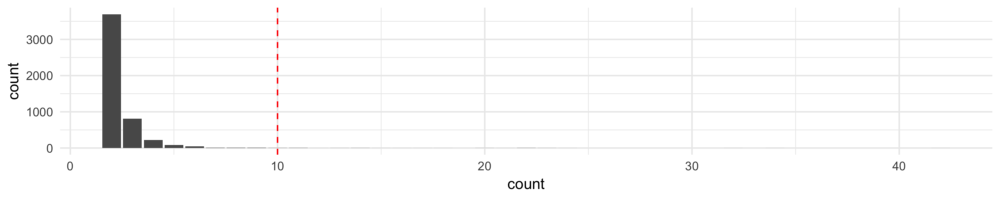

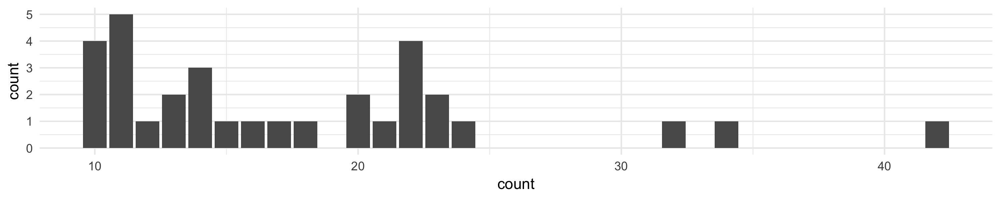

In [22]:
repeated_key <- mut_key_info[mut_key_info$count >= 2,] # keys shared by at least 2 samples
notebook_plot_size(10, 2)
ggplot(repeated_key) + geom_bar(aes(x = count)) + geom_vline(aes_(xintercept = 10), linetype = "dashed", color = "red")
ggplot(repeated_key[repeated_key$count >= 10,]) + geom_bar(aes(x = count))

### Sudy the reccurent mutations genes

In [23]:
length(unique(repeated_key$Hugo_Symbol))

[1] 448

In [24]:
head(repeated_key)

,mut_key,count,Hugo_Symbol
7,1_11169411_C_T,2,MTOR
11,1_11169776_G_A,2,MTOR
20,1_11181321_C_G,3,MTOR
27,1_11182069_G_A,2,MTOR
30,1_11182162_G_A,2,MTOR
38,1_11184683_G_A,2,MTOR


Here is a plot of the genes that are the most mutated **accross the mutation keys**:

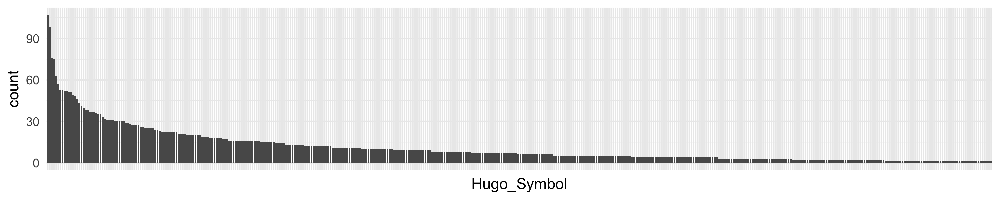

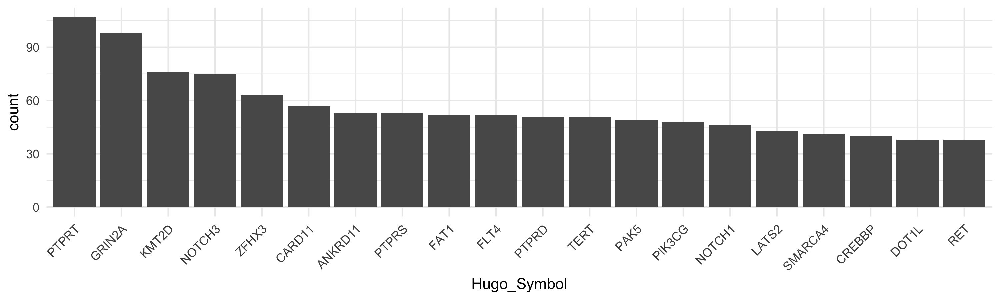

In [25]:
repeated_key <- sort_histogram(repeated_key, "Hugo_Symbol")
notebook_plot_size(10, 2)
ggplot(repeated_key) + geom_bar(aes(Hugo_Symbol)) + theme(axis.text.x = element_blank())
plot_histogram_top(repeated_key, "Hugo_Symbol", 20) + tilt_x_label_45()

Here is a plot of the genes that are the most mutated **accross the rows**:

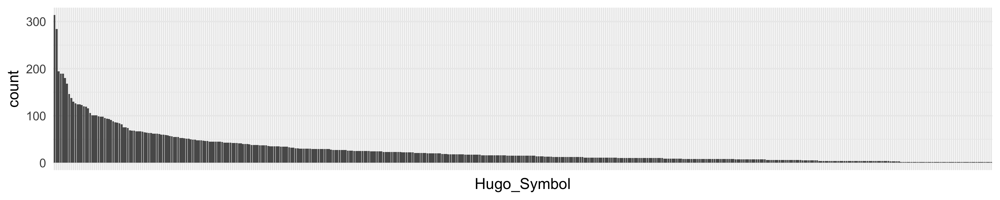

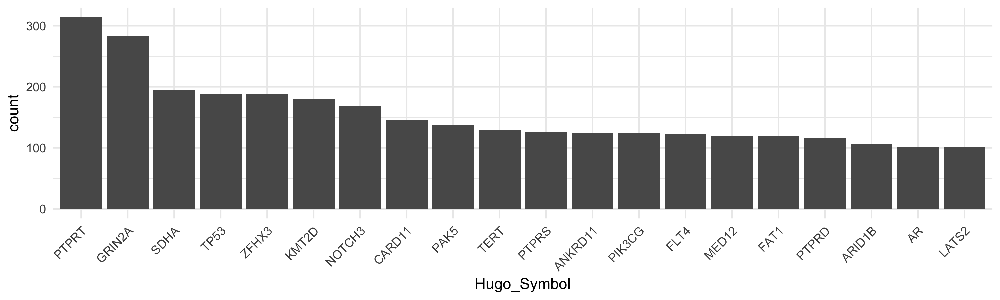

In [26]:
rec_impact <- impact_unique_mut_keys_per_patient[impact_unique_mut_keys_per_patient$mut_key %in% repeated_key$mut_key,]

rec_impact <- sort_histogram(rec_impact, "Hugo_Symbol")
notebook_plot_size(10, 2)
ggplot(rec_impact) + geom_bar(aes(Hugo_Symbol)) + theme(axis.text.x = element_blank())
plot_histogram_top(rec_impact, "Hugo_Symbol", 20) + tilt_x_label_45()

### Study the outliers present in more than 20 samples

#### Useful tools

In [27]:
open_web_windows = FALSE

See later for use of the following function:

In [28]:
get_mutation_info <- function(data, mutation_key, plots = FALSE, open_gnomad_and_cosmic_url = open_web_windows) {
    selected_rows <- data[data$mut_key == mutation_key,]
    
    mutation <- selected_rows %>% summarise(count = sum(impact_unique_mut_keys_per_patient$mut_key == mutation_key),
                                            mut_key = unique(mut_key),
                                            Hugo_Symbol = unique(Hugo_Symbol),
                                            Chromosome = unique(Chromosome),
                                            cDNA_change = toString(unique(cDNA_change)),
                                            HGVSp_Short = toString(unique(HGVSp_Short)),
                                            Kaviar_AF = unique(Kaviar_AF),
                                            cosmic_count = unique(cosmic_count),
                                            n_cancer_type = length(unique(selected_rows$cancer_type)),
                                            gnomAD_link = sprintf("http://gnomad.broadinstitute.org/variant/%s",
                                                                  gsub('_', '-', mut_key)),
                                            COSMIC_link = sprintf("https://cancer.sanger.ac.uk/cosmic/search?q=%s+%s",
                                                                  Hugo_Symbol, HGVSp_Short))
    
    if (plots) {
        
        data$name <- "0_all dataset"
        data[data$mut_key == mutation_key,]$name <- mutation_key
    
        plot1 <- plot_density(data, "t_vaf", fill = "name", height = 2, adjust = 1/3)
        
        if (any(selected_rows$frequency_in_normals != 0)) {
            plot2 <- plot_density(data[data$frequency_in_normals != 0,], "frequency_in_normals", fill = "name", height = 2, adjust = 1/3) + theme(legend.position = "none")
        }
        else
            plot2 <- ggplot() + annotate("text", x = 1, y = 1, label = "frequency_in_normals = 0") +
                                theme(text = element_blank())
        
        plot_side_by_side(plot1, plot2, height = 1.5)
    }
    
    if (open_gnomad_and_cosmic_url) {
        browseURL(mutation$gnomAD_link)
        browseURL(mutation$COSMIC_link)
    }
    
    return (mutation)
}

In [29]:
get_outlier_mut_key <- function(Hugo_Symbol) {
    return (outliers$mut_key[outliers$Hugo_Symbol == Hugo_Symbol])
}

#### Get the outliers

Let's study the outliers present in more than 20 samples:

In [30]:
outliers <- repeated_key %>% filter(count >= 20) %>%
                             arrange(-count) %>%
                             mutate(rank = row_number()) %>%
                             select(rank, count, mut_key, Hugo_Symbol)
        
outliers

rank,count,mut_key,Hugo_Symbol
1,42,X_66766359_C_T,AR
2,34,17_7579312_C_T,TP53
3,32,17_7579312_C_A,TP53
4,24,5_235397_T_G,SDHA
5,23,5_235403_C_G,SDHA
6,23,5_235406_C_G,SDHA
7,22,5_235400_C_T,SDHA
8,22,5_235415_T_C,SDHA
9,22,5_235418_T_C,SDHA
10,22,X_76907799_T_C,ATRX


#### `AR` | `X_66766359_C_T` | `p.G457G` **→ germline**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
42,X_66766359_C_T,AR,X,c.1371C>T,p.G457G,0.0001682,0,22,http://gnomad.broadinstitute.org/variant/X-66766359-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=AR+p.G457G


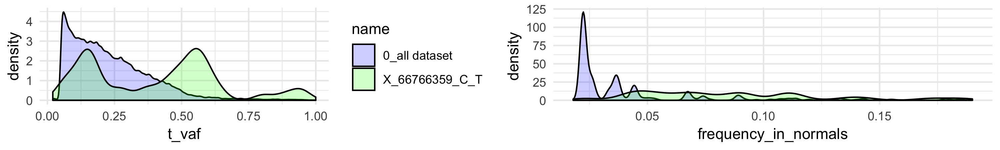

In [31]:
get_mutation_info(impact_syn, get_outlier_mut_key("AR"), plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| high                   | 0.017%      | 3.9%   | 0      | <span style="color:red">**germline**</span>   |

#### `ATRX` | `X_76907799_T_C` | `p.E1454E` **→ to study**

Warning message:
“Groups with fewer than two data points have been dropped.”

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
22,X_76907799_T_C,ATRX,X,c.4362A>G,p.E1454E,0,0,12,http://gnomad.broadinstitute.org/variant/X-76907799-T-C,https://cancer.sanger.ac.uk/cosmic/search?q=ATRX+p.E1454E


[1] "Frequency_in_normals: 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.037, 0, 0, 0, 0"

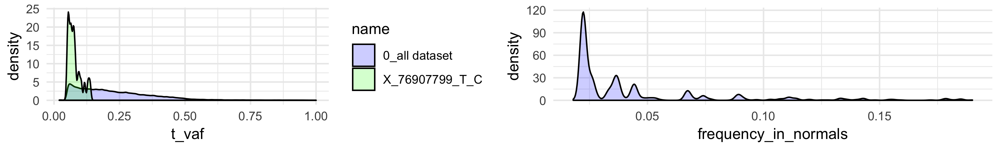

In [32]:
get_mutation_info(impact_syn, get_outlier_mut_key("ATRX"), plots = TRUE)
sprintf("Frequency_in_normals: %s",
        toString(impact_syn$frequency_in_normals[impact_syn$mut_key == get_outlier_mut_key("ATRX")]))

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| $\approx 0$            | 0           | 0      | 0      | <span style="color:green">**to study**</span> |

**Conclusion after IGV study**: artefact  
Low vaf, mutation only carried by end of reads and a lot of other mutations around.

#### `ARID1B` | `6_157099426_A_G` | `p.Q121Q` **→ germline**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
20,6_157099426_A_G,ARID1B,6,c.363A>G,p.Q121Q,0.0004657,0,12,http://gnomad.broadinstitute.org/variant/6-157099426-A-G,https://cancer.sanger.ac.uk/cosmic/search?q=ARID1B+p.Q121Q


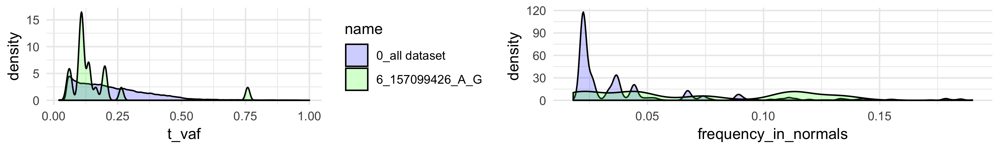

In [33]:
get_mutation_info(impact_syn, get_outlier_mut_key("ARID1B"), plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| high                   | 0.047%      | 0.4%   | 0      | <span style="color:red">**germline**</span>   |

#### `TP53` | `17_7579312_C_T`, `17_7579312_C_A` | `p.T125T`, `17_7579312_C_G` | `p.T125T` **→ to study**

* These two synonymous mutations are acting on the same 3-bp
* The `HGVSp_Short` concerned is `p.T125T`
* They concern different patients

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
34,17_7579312_C_T,TP53,17,c.375G>A,p.T125T,6.5e-06,18,19,http://gnomad.broadinstitute.org/variant/17-7579312-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=TP53+p.T125T


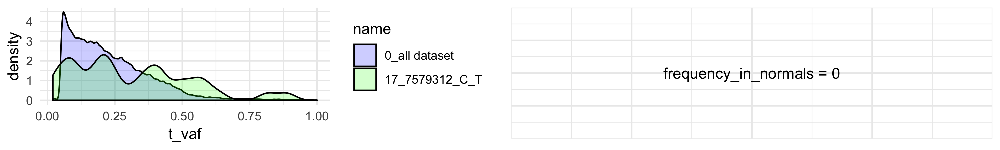

In [34]:
get_mutation_info(impact_syn, get_outlier_mut_key("TP53")[1], plots = TRUE)

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
32,17_7579312_C_A,TP53,17,c.375G>T,p.T125T,6.5e-06,17,8,http://gnomad.broadinstitute.org/variant/17-7579312-C-A,https://cancer.sanger.ac.uk/cosmic/search?q=TP53+p.T125T


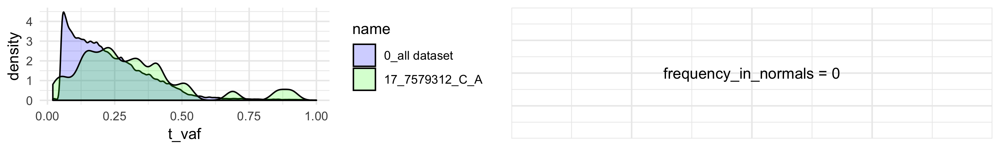

In [35]:
get_mutation_info(impact_syn, get_outlier_mut_key("TP53")[2], plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| 0                      | 6.5e-6      | 0      | 30     | <span style="color:green">**to study**</span> |
| 0                      | 6.5e-6      | 0      | 37     | <span style="color:green">**to study**</span> |

COSMIC variants : `c.375G>C` cc = 4

In [36]:
impact_syn[impact_syn$Hugo_Symbol == "TP53" & impact_syn$cDNA_change == "c.375G>C",]

,Hugo_Symbol,Chromosome,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,cDNA_change,HGVSp_Short,t_depth,t_vaf,t_alt_count,n_depth,n_vaf,n_alt_count,t_ref_plus_count,t_ref_neg_count,t_alt_plus_count,t_alt_neg_count,confidence_class,sample_coverage,mut_key,sample_mut_key,frequency_in_normals,Kaviar_AF,cosmic_count,is_a_hotspot,is_a_3d_hotspot,oncogenic,gene_type,BAM_id,cancer_code,cancer_type,type,strand_ratio,patient_id
75550,TP53,17,7579312,7579312,synonymous_SNV,SNP,C,G,P-0009867-T01-IM5,c.375G>C,p.T125T,959,0.76851,737,338,0,0,123,96,411,326,UNKNOWN,1130,17_7579312_C_G,P-0009867-T01-IM5_17_7579312_C_G,0,0,4,unknown,unknown,Unknown,tsg,OY319631-T,VMM,Vagina,synonymous,0.7931873,P-0009867
97798,TP53,17,7579312,7579312,synonymous_SNV,SNP,C,G,P-0012717-T01-IM5,c.375G>C,p.T125T,342,0.88596,303,379,0,0,26,13,178,125,UNKNOWN,915,17_7579312_C_G,P-0012717-T01-IM5_17_7579312_C_G,0,0,4,unknown,unknown,Unknown,tsg,JJ878816-T,GBM,Brain,synonymous,0.7022472,P-0012717
109648,TP53,17,7579312,7579312,synonymous_SNV,SNP,C,G,P-0013977-T01-IM5,c.375G>C,p.T125T,528,0.31061,164,413,0,0,208,154,99,65,UNKNOWN,961,17_7579312_C_G,P-0013977-T01-IM5_17_7579312_C_G,0,0,4,unknown,unknown,Unknown,tsg,RP681882-T,LUAS,Lung,synonymous,0.6565657,P-0013977
138433,TP53,17,7579312,7579312,synonymous_SNV,SNP,C,G,P-0017157-T01-IM6,c.375G>C,p.T125T,778,0.06427,50,550,0,0,413,311,27,23,UNKNOWN,905,17_7579312_C_G,P-0017157-T01-IM6_17_7579312_C_G,0,0,4,unknown,unknown,Unknown,tsg,SH983978-T,LUAD,Lung,synonymous,0.8518519,P-0017157
202870,TP53,17,7579312,7579312,synonymous_SNV,SNP,C,G,P-0023859-T01-IM6,c.375G>C,p.T125T,454,0.07269,33,541,0,0,248,173,22,11,UNKNOWN,497,17_7579312_C_G,P-0023859-T01-IM6_17_7579312_C_G,0,0,4,unknown,unknown,Unknown,tsg,XM853556-T,LUAD,Lung,synonymous,0.5000000,P-0023859


**Conclusion after IGV study**: true (see #Results at the end of the notebook)

#### `SDHA` 8 outliers **→ to study**

* These 8 synonymous mutations are acting on the same domain from `p.V395` to `p.Y408` (`p.V395V`, `p.T396T`, `p.P401P`, `p.V402V`, `p.L403L`, `p.P404P`, `p.H407H`, `p.Y408Y`)
* They concern 24 different patients, almost all having each of the 8 mutations with a similar `t_vaf` (see plots under)
* They all have a null gnomAD and `frequency_in_normals` (except for one, `5_235400_C_T` having a really low gnomAD score 0.000004061 and a low `frequency_in_normals`)
* 2 of them appear in COSMIC with a low cosmic count:
    * `c.1212C>T` (`p.P404P`) cc = 1
    * `c.1188G>A` (`p.T396T`) cc = 2

24 patients are concerned with these 8 high reccurences in `SDHA`:

In [37]:
SDHA_outliers <- outliers[outliers$Hugo_Symbol == "SDHA",]

In [38]:
patients_concerned <- unique(impact_syn$patient_id[impact_syn$mut_key %in% SDHA_outliers$mut_key])
length(patients_concerned)
print(patients_concerned)

[1] 24

 [1] "P-0016594" "P-0016853" "P-0016922" "P-0016945" "P-0018570" "P-0018600"
 [7] "P-0018613" "P-0018627" "P-0018657" "P-0018659" "P-0018697" "P-0018696"
[13] "P-0018690" "P-0018693" "P-0018708" "P-0018709" "P-0018757" "P-0018794"
[19] "P-0018832" "P-0018833" "P-0018839" "P-0018845" "P-0018867" "P-0018900"


In [39]:
dd <- data.frame()

for (id in SDHA_outliers$rank)
    dd <- rbind(dd, get_mutation_info(impact_syn, outliers$mut_key[outliers$rank == id],
                                      plots = FALSE, open_gnomad_and_cosmic_url = FALSE))
dd

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
24,5_235397_T_G,SDHA,5,c.1203T>G,p.P401P,0,0,16,http://gnomad.broadinstitute.org/variant/5-235397-T-G,https://cancer.sanger.ac.uk/cosmic/search?q=SDHA+p.P401P
23,5_235403_C_G,SDHA,5,c.1209C>G,p.L403L,0,0,15,http://gnomad.broadinstitute.org/variant/5-235403-C-G,https://cancer.sanger.ac.uk/cosmic/search?q=SDHA+p.L403L
23,5_235406_C_G,SDHA,5,c.1212C>G,p.P404P,0,0,15,http://gnomad.broadinstitute.org/variant/5-235406-C-G,https://cancer.sanger.ac.uk/cosmic/search?q=SDHA+p.P404P
22,5_235400_C_T,SDHA,5,c.1206C>T,p.V402V,0,0,15,http://gnomad.broadinstitute.org/variant/5-235400-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=SDHA+p.V402V
22,5_235415_T_C,SDHA,5,c.1221T>C,p.H407H,0,0,15,http://gnomad.broadinstitute.org/variant/5-235415-T-C,https://cancer.sanger.ac.uk/cosmic/search?q=SDHA+p.H407H
22,5_235418_T_C,SDHA,5,c.1224T>C,p.Y408Y,0,0,15,http://gnomad.broadinstitute.org/variant/5-235418-T-C,https://cancer.sanger.ac.uk/cosmic/search?q=SDHA+p.Y408Y
21,5_235382_G_C,SDHA,5,c.1188G>C,p.T396T,0,0,13,http://gnomad.broadinstitute.org/variant/5-235382-G-C,https://cancer.sanger.ac.uk/cosmic/search?q=SDHA+p.T396T
20,5_235379_C_G,SDHA,5,c.1185C>G,p.V395V,0,0,12,http://gnomad.broadinstitute.org/variant/5-235379-C-G,https://cancer.sanger.ac.uk/cosmic/search?q=SDHA+p.V395V


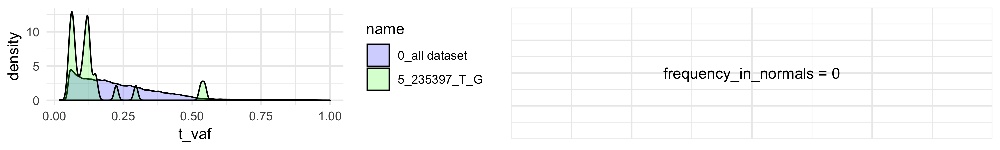

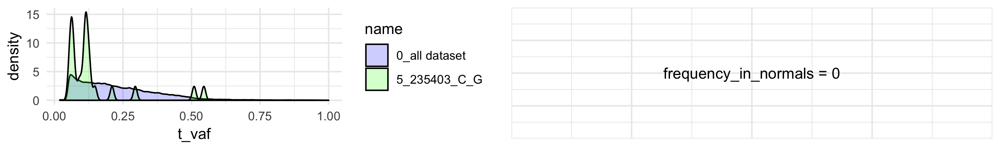

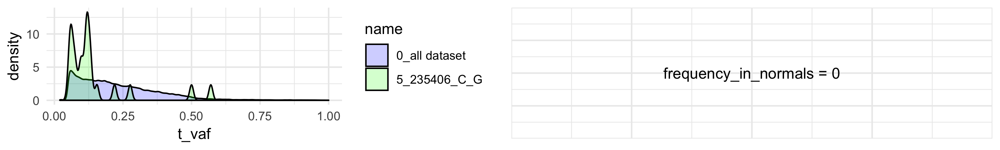

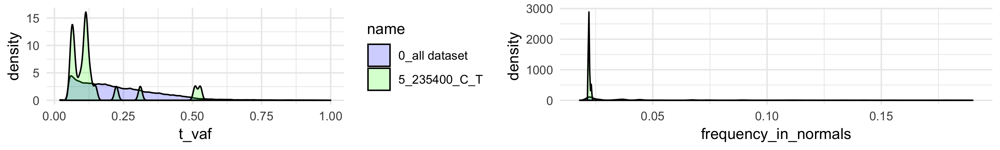

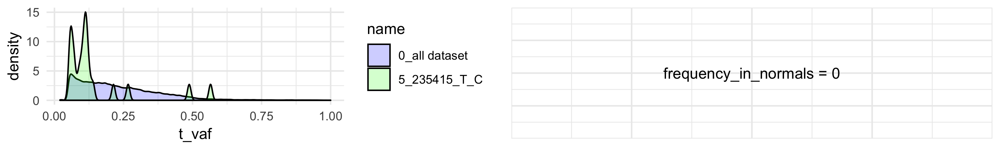

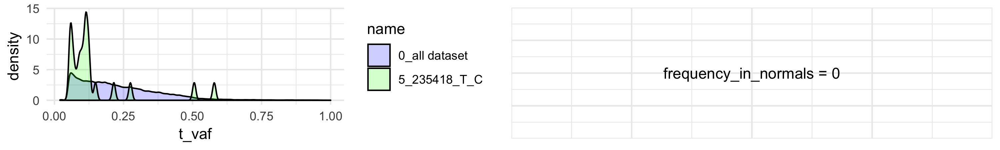

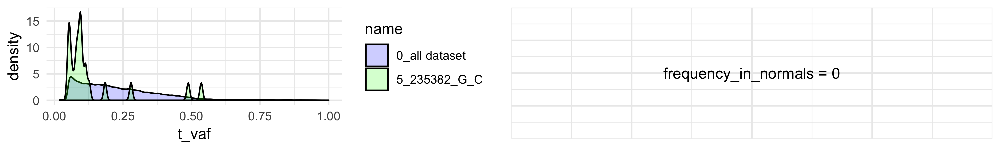

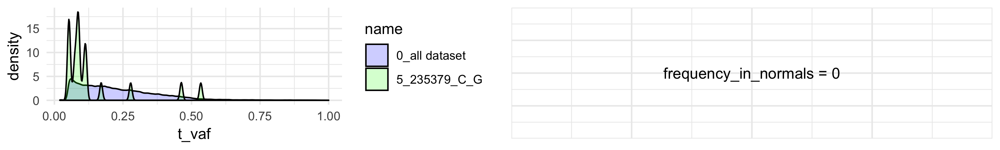

In [40]:
for (id in SDHA_outliers$rank)
    get_mutation_info(impact_syn, outliers$mut_key[outliers$rank == id],
                      plots = TRUE, open_gnomad_and_cosmic_url = FALSE)

**Conclusion after IGV study**: artefact  
Reads carrying the mutation looks like PCR duplicate across all 24 patients. Regular reads don't carry the mutation.

### Study the outliers present in more than 10 samples

#### Get the outliers

In [41]:
outliers <- repeated_key %>% filter(count >= 10 & count < 20) %>%
                             arrange(-count) %>%
                             mutate(rank = row_number()) %>%
                             select(rank, count, mut_key, Hugo_Symbol)

outliers

rank,count,mut_key,Hugo_Symbol
1,18,6_26056117_C_T,HIST1H1C
2,17,X_70361115_G_A,MED12
3,16,6_157100008_A_C,ARID1B
4,15,X_70361103_G_A,MED12
5,14,12_25380278_A_T,KRAS
6,14,16_72821618_A_G,ZFHX3
7,14,6_31324682_C_T,HLA-B
8,13,16_72831388_C_T,ZFHX3
9,13,20_41101171_G_A,PTPRT
10,12,17_7574004_G_A,TP53


#### `HIST1H1C` | `6_26056117_C_T` | `p.A180A` **→ to study**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
18,6_26056117_C_T,HIST1H1C,6,c.540G>A,p.A180A,2.59e-05,4,6,http://gnomad.broadinstitute.org/variant/6-26056117-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=HIST1H1C+p.A180A


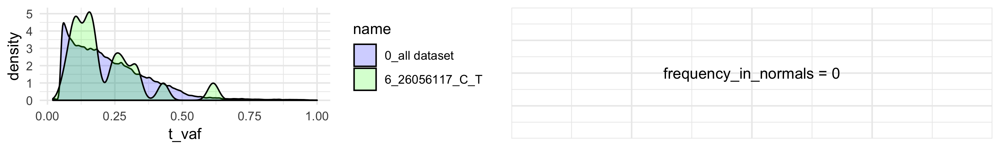

In [42]:
get_mutation_info(impact_syn, get_outlier_mut_key("HIST1H1C"), plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| 0                      | 2.6e-5      | 2.8e-5 | 8      | <span style="color:green">**to study**</span> |

COSMIC variants : `c.540G>T` cc = 3, `c.540G>C` cc = 2

**Conclusion after IGV study**: true (see #Results at the end of the notebook)

#### `MED12` | `X_70361115_G_A` | `p.Q2101Q` and `X_70361103_G_A` | `p.Q2097Q` **→ artefact?**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
17,X_70361115_G_A,MED12,X,c.6303G>A,p.Q2101Q,9.06e-05,0,12,http://gnomad.broadinstitute.org/variant/X-70361115-G-A,https://cancer.sanger.ac.uk/cosmic/search?q=MED12+p.Q2101Q


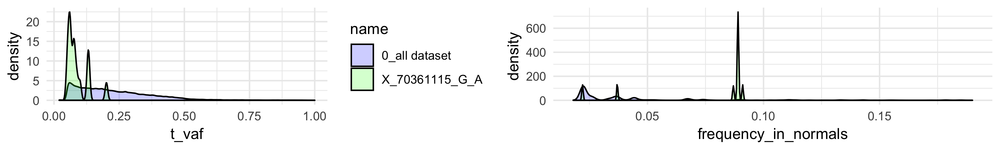

In [43]:
get_mutation_info(impact_syn, get_outlier_mut_key("MED12")[1], plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| high                   | 9.1e-5      | 0      | 0      | <span style="color:red">**artefact?**</span>  |

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
15,X_70361103_G_A,MED12,X,c.6291G>A,p.Q2097Q,1.94e-05,0,12,http://gnomad.broadinstitute.org/variant/X-70361103-G-A,https://cancer.sanger.ac.uk/cosmic/search?q=MED12+p.Q2097Q


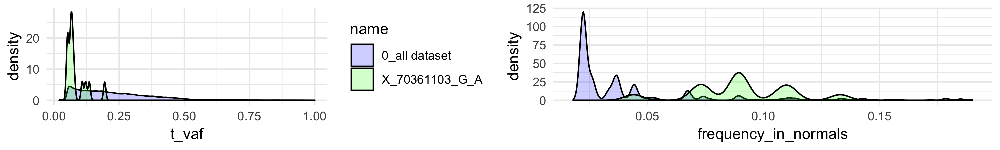

In [44]:
get_mutation_info(impact_syn, get_outlier_mut_key("MED12")[2], plots = TRUE)

High `frequency_in_normals`, `Kaviar_AF` not null, and the second one exists in gnomAD (allele frequency of 0.000009194): probably germline.

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| high                   | 1.9e-5      | 9.2e-6 | 0      | <span style="color:red">**artefact?**</span>  |

**Conclusion after IGV study**: artefacts  
Mutations carried only by the extremity of bad mapping quality reads.

#### `ARID1B` | `6_157100008_A_C` | `p.G315G` **→ germline**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
16,6_157100008_A_C,ARID1B,6,c.945A>C,p.G315G,0.0003816,0,15,http://gnomad.broadinstitute.org/variant/6-157100008-A-C,https://cancer.sanger.ac.uk/cosmic/search?q=ARID1B+p.G315G


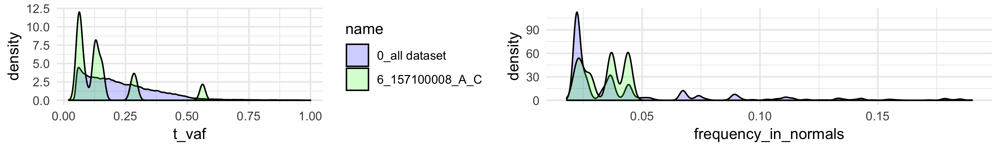

In [45]:
get_mutation_info(impact_syn, get_outlier_mut_key("ARID1B"), plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| high                   | 0.038%      | 0.15%  | 0      | <span style="color:red">**germline**</span>   |

#### `KRAS` | `12_25380278_A_T` | `p.G60G` **→ to study**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
14,12_25380278_A_T,KRAS,12,c.180T>A,p.G60G,6.5e-06,5,7,http://gnomad.broadinstitute.org/variant/12-25380278-A-T,https://cancer.sanger.ac.uk/cosmic/search?q=KRAS+p.G60G


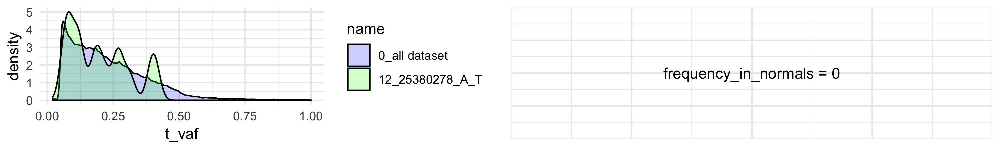

In [46]:
get_mutation_info(impact_syn, get_outlier_mut_key("KRAS"), plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| 0                      | 6.5e-6      | 0      | 8      | <span style="color:green">**to study**</span> |

COSMIC variant: `c.180T>C` cc = 3

**Conclusion after IGV study**: synonymous_SNV  
Clean reads, 10 cases with GA/TT one base pair before (non-synonymous).

In [47]:
impact %>% filter(Hugo_Symbol == "KRAS" &
                  Start_Position %in% c("25380277") &
                  Tumor_Sample_Barcode %in% impact$Tumor_Sample_Barcode[impact$mut_key %in% c("12_25380278_A_T")]  &
                  Consequence != "synonymous_SNV") %>%
                  select(mut_key, Start_Position, End_Position, Consequence, Variant_Type, Reference_Allele, Tumor_Seq_Allele2, Tumor_Sample_Barcode)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode
12_25380277_G_T,25380277,25380277,nonsynonymous_SNV,SNP,G,T,P-0006207-T01-IM5
12_25380277_G_T,25380277,25380277,nonsynonymous_SNV,SNP,G,T,P-0004010-T01-IM3
12_25380277_G_T,25380277,25380277,nonsynonymous_SNV,SNP,G,T,P-0008747-T01-IM5
12_25380277_GA_TT,25380277,25380278,nonsynonymous_SNV,DNP,GA,TT,P-0008844-T01-IM5
12_25380277_GA_TT,25380277,25380278,nonsynonymous_SNV,DNP,GA,TT,P-0011264-T01-IM5
12_25380277_GA_TT,25380277,25380278,nonsynonymous_SNV,DNP,GA,TT,P-0009403-T02-IM5
12_25380277_GA_TT,25380277,25380278,nonsynonymous_SNV,DNP,GA,TT,P-0015237-T01-IM6
12_25380277_GA_TT,25380277,25380278,nonsynonymous_SNV,DNP,GA,TT,P-0017446-T01-IM6
12_25380277_G_T,25380277,25380277,nonsynonymous_SNV,SNP,G,T,P-0017586-T01-IM5
12_25380277_GA_TT,25380277,25380278,nonsynonymous_SNV,DNP,GA,TT,P-0018933-T01-IM6


#### `ZFHX3` | `16_72821618_A_G` | `p.G3519G` and `16_72831388_C_T` | `p.Q1731Q` **→ artefact?**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
14,16_72821618_A_G,ZFHX3,16,c.10557G>C,p.G3519G,0.0001229,0,10,http://gnomad.broadinstitute.org/variant/16-72821618-A-G,https://cancer.sanger.ac.uk/cosmic/search?q=ZFHX3+p.G3519G


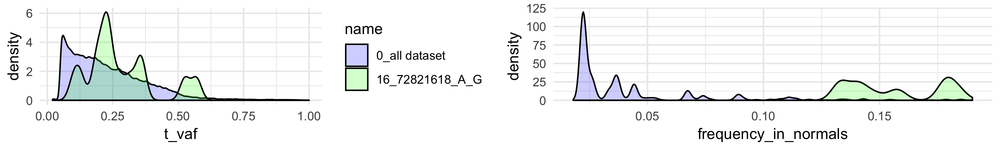

In [48]:
get_mutation_info(impact_syn, get_outlier_mut_key("ZFHX3")[1], plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| high                   | 0.013%      | 0.80%  | 0      | <span style="color:red">**germline**</span>  |

Cosmic variant: `c.10557T>C` cc = 29

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
13,16_72831388_C_T,ZFHX3,16,c.5193G>A,p.Q1731Q,0.0004204,0,10,http://gnomad.broadinstitute.org/variant/16-72831388-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=ZFHX3+p.Q1731Q


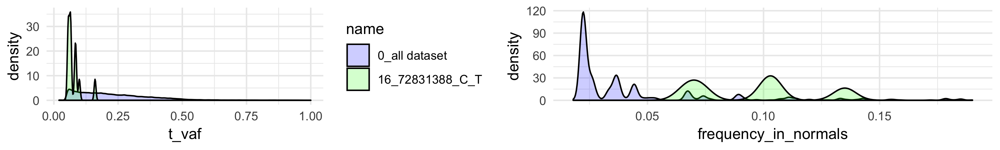

In [49]:
get_mutation_info(impact_syn, get_outlier_mut_key("ZFHX3")[2], plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| high                   | 0.043%      | 4.2e-6 | 0      | <span style="color:red">**germline**</span>  |

**Conclusion after IGV study**: artefacts

#### `HLA-B` | `6_31324682_C_T` | `p.G42G` **→ artefact?**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
14,6_31324682_C_T,HLA-B,6,c.126G>A,p.G42G,2.59e-05,0,10,http://gnomad.broadinstitute.org/variant/6-31324682-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=HLA-B+p.G42G


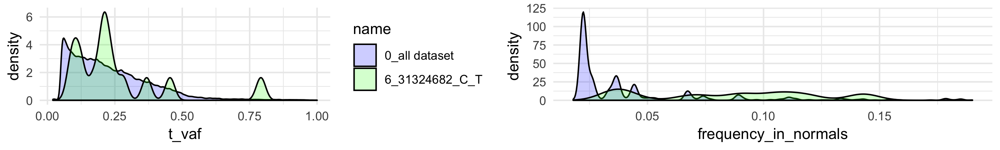

In [50]:
get_mutation_info(impact_syn, get_outlier_mut_key("HLA-B"), plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| high                   | 2.6e-5      | 9.2e-5 | 0      | <span style="color:red">**artefact?**</span>  |

**Conclusion after IGV study**: artefact  
End of bad quality reads.

#### `PTPRT` | `20_41101171_G_A` | `p.I395I` and `20_40790142_C_T` | `p.T863T` **→ to study and germline**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
13,20_41101171_G_A,PTPRT,20,c.1185C>T,p.I395I,1.29e-05,0,5,http://gnomad.broadinstitute.org/variant/20-41101171-G-A,https://cancer.sanger.ac.uk/cosmic/search?q=PTPRT+p.I395I


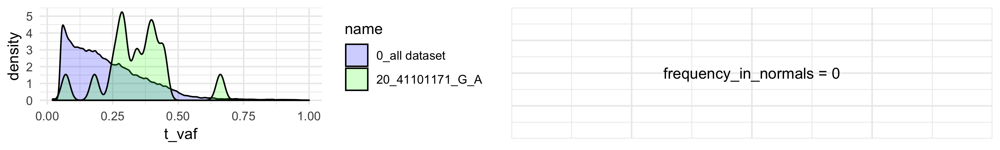

In [51]:
get_mutation_info(impact_syn, get_outlier_mut_key("PTPRT")[1], plots = TRUE)

**Conclusion after IGV study**: true (see #Results at the end of the notebook)

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
11,20_40790142_C_T,PTPRT,20,c.2589G>A,p.T863T,6.47e-05,1,4,http://gnomad.broadinstitute.org/variant/20-40790142-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=PTPRT+p.T863T


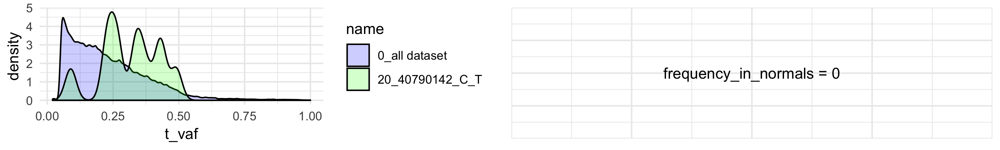

In [52]:
get_mutation_info(impact_syn, get_outlier_mut_key("PTPRT")[2], plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| 0                      | 6.5e-5      | 0.01%  | 0      | <span style="color:red">**germline**</span>   |

#### `TP53` | `17_7574004_G_A` | `p.F341F` and `17_7578177_C_T` | `p.E224E` **→ to study**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
12,17_7574004_G_A,TP53,17,c.1023C>T,p.F341F,0,0,5,http://gnomad.broadinstitute.org/variant/17-7574004-G-A,https://cancer.sanger.ac.uk/cosmic/search?q=TP53+p.F341F


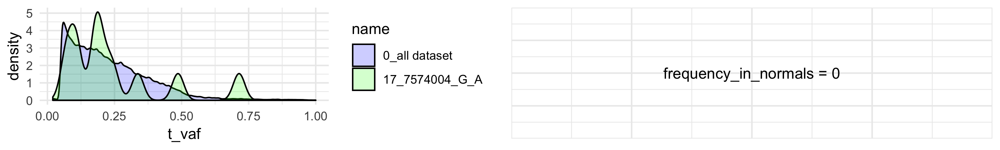

In [53]:
get_mutation_info(impact_syn, get_outlier_mut_key("TP53")[1], plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| 0                      | 0           | 0      | 0      | <span style="color:green">**to study**</span> |

**Conclusion after IGV study**: false  
The real mutation is `GG/AA` stopgain mutation (all reads are holding this DNP mutation) at position 7574003.

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
11,17_7578177_C_T,TP53,17,c.672G>A,p.E224E,6.5e-06,8,6,http://gnomad.broadinstitute.org/variant/17-7578177-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=TP53+p.E224E


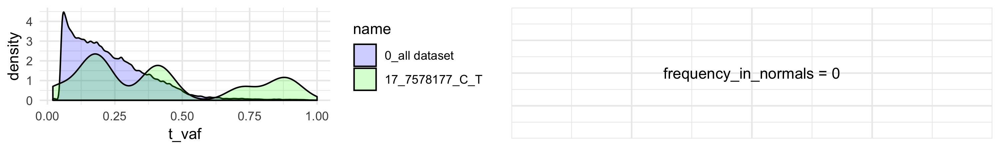

In [54]:
get_mutation_info(impact_syn, get_outlier_mut_key("TP53")[2], plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| 0                      | 6.5e-6      | 0      | 15     | <span style="color:green">**to study**</span> |

**Conclusion after IGV study**: true (see #Results at the end of the notebook)

#### `IGF1` | `12_102811752_C_T` | `p.T144T` **→ germline**

Warning message:
“Groups with fewer than two data points have been dropped.”

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
11,12_102811752_C_T,IGF1,12,c.432G>A,p.T144T,0.0003428,1,7,http://gnomad.broadinstitute.org/variant/12-102811752-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=IGF1+p.T144T


[1] "Frequency_in_normals: 0, 0, 0, 0, 0, 0, 0, 0.022, 0, 0, 0, 0, 0"

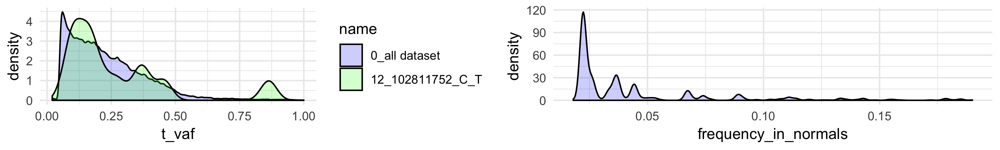

In [55]:
get_mutation_info(impact_syn, get_outlier_mut_key("IGF1"), plots = TRUE)
sprintf("Frequency_in_normals: %s",
        toString(impact_syn$frequency_in_normals[impact_syn$mut_key == get_outlier_mut_key("IGF1")]))

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| $\approx  0$           | 0.034%      | 0.042% | 0      | <span style="color:red">**germline**</span>   |

#### `BCL2` | `18_60985834_C_T` | `p.K22K` and `18_60985833_G_A` | `p.L23L` **→ to study**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
11,18_60985834_C_T,BCL2,18,c.66G>A,p.K22K,0,1,6,http://gnomad.broadinstitute.org/variant/18-60985834-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=BCL2+p.K22K


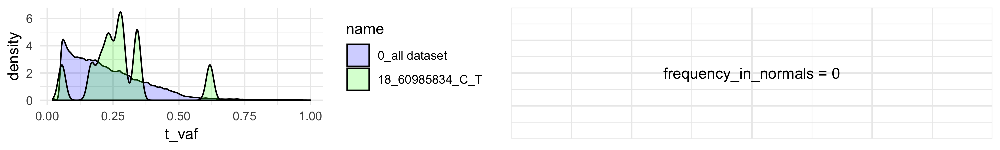

In [56]:
get_mutation_info(impact_syn, get_outlier_mut_key("BCL2")[1], plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| 0                      | 0           | 0      | 13     | <span style="color:green">**to study**</span> |

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
10,18_60985833_G_A,BCL2,18,c.67C>T,p.L23L,0,1,4,http://gnomad.broadinstitute.org/variant/18-60985833-G-A,https://cancer.sanger.ac.uk/cosmic/search?q=BCL2+p.L23L


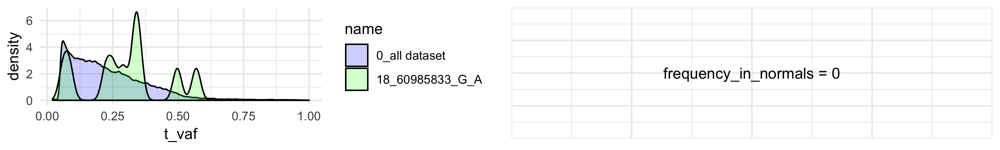

In [57]:
get_mutation_info(impact_syn, get_outlier_mut_key("BCL2")[2], plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| 0                      | 0           | 0      | 6      | <span style="color:green">**to study**</span> |

**Conclusion after IGV study**: true (see #Results at the end of the notebook)

#### `PAK5` | `20_9525085_C_T` | `p.R600R` **→ to study**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
11,20_9525085_C_T,PAK5,20,c.1800G>A,p.R600R,0,0,2,http://gnomad.broadinstitute.org/variant/20-9525085-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=PAK5+p.R600R


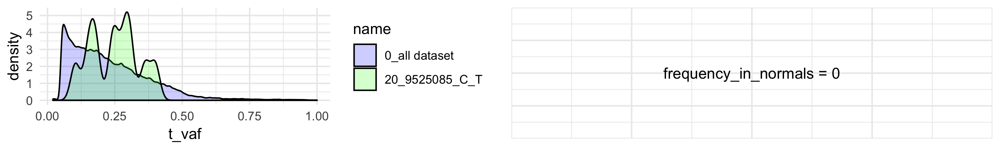

In [58]:
get_mutation_info(impact_syn, get_outlier_mut_key("PAK5"), plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| 0                      | 0           | 0      | 0      | <span style="color:green">**to study**</span> |

**Conclusion after IGV study**: true (see #Results at the end of the notebook)

#### `ERG` | `21_39795342_G_A` | `p.I126I` **→ to study**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
10,21_39795342_G_A,ERG,21,c.378C>T,p.I126I,0,0,5,http://gnomad.broadinstitute.org/variant/21-39795342-G-A,https://cancer.sanger.ac.uk/cosmic/search?q=ERG+p.I126I


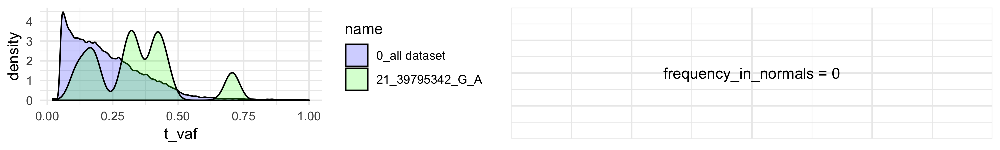

In [59]:
get_mutation_info(impact_syn, get_outlier_mut_key("ERG"), plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| 0                      | 0           | 0      | 0      | <span style="color:green">**to study**</span> |

**Conclusion after IGV study**: true (see #Results at the end of the notebook)

#### `E2F3` | `6_20402595_C_T` | `p.F44F` **→ artefact?**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
10,6_20402595_C_T,E2F3,6,c.132C>T,p.F44F,6.5e-06,0,6,http://gnomad.broadinstitute.org/variant/6-20402595-C-T,https://cancer.sanger.ac.uk/cosmic/search?q=E2F3+p.F44F


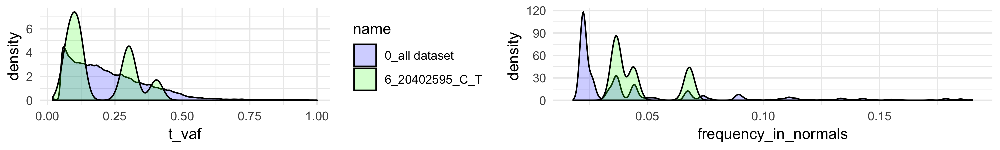

In [60]:
get_mutation_info(impact_syn, get_outlier_mut_key("E2F3"), plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| high                   | 6.5e-6      | 8.9e-6 | 1      | <span style="color:green">**artefact?**</span>|

In [61]:
dd <- get_outlier_mut_key("E2F3")

impact %>% filter(Hugo_Symbol == "E2F3" &
                  Start_Position %in% c("20402596") &
                  BAM_id %in% impact$BAM_id[impact$mut_key == "6_20402595_C_T"] &
                  mut_key != "6_20402595_C_T")

Hugo_Symbol,Chromosome,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,cDNA_change,HGVSp_Short,t_depth,t_vaf,t_alt_count,n_depth,n_vaf,n_alt_count,t_ref_plus_count,t_ref_neg_count,t_alt_plus_count,t_alt_neg_count,confidence_class,sample_coverage,mut_key,sample_mut_key,frequency_in_normals,Kaviar_AF,cosmic_count,is_a_hotspot,is_a_3d_hotspot,oncogenic,gene_type,BAM_id,cancer_code,cancer_type,type,strand_ratio


**Conclusion after IGV study**: artefact   
Every group of read carrying the mutation is followed by 2-5 read carrying a 4 bp deletion at the same position, which has not been called. The frequency in normal and the context (GCGCGCGCGC) let us think it is an artefct/common mutation.

#### `MDC1` | `6_30673105_C_G` | `p.V1285V` **→ germline**

count,mut_key,Hugo_Symbol,Chromosome,cDNA_change,HGVSp_Short,Kaviar_AF,cosmic_count,n_cancer_type,gnomAD_link,COSMIC_link
10,6_30673105_C_G,MDC1,6,c.3855G>C,p.V1285V,0.0002393,0,7,http://gnomad.broadinstitute.org/variant/6-30673105-C-G,https://cancer.sanger.ac.uk/cosmic/search?q=MDC1+p.V1285V


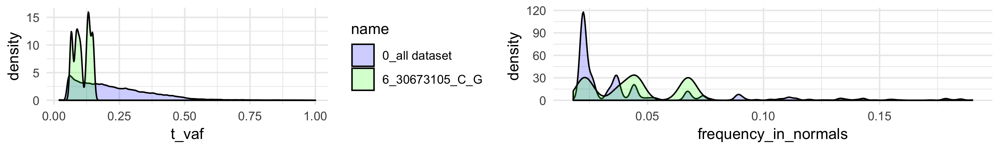

In [62]:
get_mutation_info(impact_syn, get_outlier_mut_key("MDC1"), plots = TRUE)

| `frequency_in_normals` | KaviarAF    | gnomAD | COSMIC | classification                                |
| ---------------------- | ----------- | ------ | ------ | --------------------------------------------- |
| high                   | 0.024%      | 0.039% | 0      | <span style="color:red">**germline**</span>   |

### Further study of selected outliers

In [63]:
get_bam_id <- function(mutation_key) {
    return (paste0(impact_syn$BAM_id[impact_syn$mut_key == mutation_key], ".bam"))
}

In [64]:
selected_mut_key_to_study <- c(
"X_76907799_T_C",
"17_7579312_C_T",
"17_7579312_C_A",
"17_7579312_C_G",
"5_235397_T_G",
"5_235403_C_G",
"5_235406_C_G",
"5_235400_C_T",
"5_235415_T_C",
"5_235418_T_C",
"5_235382_G_C",
"5_235379_C_G",
"6_26056117_C_T",
"12_25380278_A_T",
"20_40790142_C_T",
"17_7574004_G_A",
"17_7578177_C_T",
"18_60985834_C_T",
"18_60985833_G_A",
"20_9525085_C_T",
"21_39795342_G_A")

selected_mut_key_artefact <- c(
"X_70361115_G_A",
"X_70361103_G_A",
"16_72821618_A_G",
"16_72831388_C_T",
"6_31324682_C_T",
"20_41101171_G_A",
"6_20402595_C_T")

In [65]:
dd <- data.frame()

for (key in c(selected_mut_key_to_study, selected_mut_key_artefact))
    dd <- rbind(dd, get_mutation_info(impact_syn, key, plots = FALSE, open_gnomad_and_cosmic_url = FALSE))

dd$classification <- "to_study"
dd$classification[dd$mut_key %in% selected_mut_key_artefact] <- "artefact"

dd$BAM_ids <- lapply(dd$mut_key, function(x) get_bam_id(x))


head(dd[,c("classification", "Hugo_Symbol", "HGVSp_Short", "mut_key", "count", "BAM_ids")], 50)

classification,Hugo_Symbol,HGVSp_Short,mut_key,count,BAM_ids
to_study,ATRX,p.E1454E,X_76907799_T_C,22,"AB993634-T.bam, BA776743-T.bam, TL968381-T.bam, ZK342685-T.bam, SE614208-T.bam, PY164705-T.bam, FQ371104-T.bam, GB261560-T.bam, KO756428-T.bam, LA817589-T.bam, GA576779-T.bam, FO033052-T.bam, KL818996-T.bam, QI579093-T.bam, LD437720-T.bam, YJ010396-T.bam, KO887381-T.bam, not_found.bam , WW837952-T.bam, MZ129795-T.bam, IB527713-T.bam, AJ301018-T.bam"
to_study,TP53,p.T125T,17_7579312_C_T,34,"FT682612-T.bam, PH381618-T.bam, UA521082-T.bam, OM250820-T.bam, not_found.bam , AF535165-T.bam, not_found.bam , not_found.bam , EU413651-T.bam, NS070777-T.bam, CM863712-T.bam, TO592212-T.bam, TO884199-T.bam, not_found.bam , MJ456936-T.bam, not_found.bam , UO280545-T.bam, not_found.bam , RP674120-T.bam, XY133610-T.bam, VH738233-T.bam, WO980946-T.bam, not_found.bam , DN594927-T.bam, QF175112-T.bam, not_found.bam , not_found.bam , not_found.bam , HJ637051-T.bam, CH510551-T.bam, ZJ580364-T.bam, NG472456-T.bam, not_found.bam , not_found.bam , SG774432-T.bam, XO783227-T.bam"
to_study,TP53,p.T125T,17_7579312_C_A,32,"IX465149-T.bam, QN758492-T.bam, not_found.bam , ZU155454-T.bam, CW956274-T.bam, QI384161-T.bam, KH366186-T.bam, TH460820-T.bam, UR841148-T.bam, PW856012-T.bam, not_found.bam , EF799067-T.bam, WG343822-T.bam, SM110023-T.bam, VT890333-T.bam, GL235307-T.bam, LI014657-T.bam, not_found.bam , JP438431-T.bam, RI816431-T.bam, RC682484-T.bam, FH259595-T.bam, not_found.bam , VV609043-T.bam, UO940191-T.bam, OA023408-T.bam, not_found.bam , not_found.bam , YV331297-T.bam, not_found.bam , LX200459-T.bam, YD906448-T.bam, MM520691-T.bam, HP028831-T.bam, AQ407957-T.bam"
to_study,TP53,p.T125T,17_7579312_C_G,5,"OY319631-T.bam, JJ878816-T.bam, RP681882-T.bam, SH983978-T.bam, XM853556-T.bam"
to_study,SDHA,p.P401P,5_235397_T_G,24,"YR551244-T.bam, JX878915-T.bam, MZ276103-T.bam, UO744733-T.bam, not_found.bam , GR938251-T.bam, not_found.bam , DN825679-T.bam, YK634628-T.bam, TN075880-T.bam, UZ638506-T.bam, EW742803-T.bam, YN827525-T.bam, not_found.bam , TI732463-T.bam, KH214158-T.bam, CO535172-T.bam, WZ930928-T.bam, not_found.bam , not_found.bam , QW883900-T.bam, ZF563082-T.bam, RA649346-T.bam, IW885324-T.bam, XU321772-T.bam"
to_study,SDHA,p.L403L,5_235403_C_G,23,"YR551244-T.bam, JX878915-T.bam, MZ276103-T.bam, UO744733-T.bam, not_found.bam , GR938251-T.bam, not_found.bam , DN825679-T.bam, TN075880-T.bam, UZ638506-T.bam, EW742803-T.bam, YN827525-T.bam, not_found.bam , TI732463-T.bam, KH214158-T.bam, CO535172-T.bam, WZ930928-T.bam, not_found.bam , not_found.bam , QW883900-T.bam, ZF563082-T.bam, RA649346-T.bam, IW885324-T.bam, XU321772-T.bam"
to_study,SDHA,p.P404P,5_235406_C_G,23,"YR551244-T.bam, JX878915-T.bam, MZ276103-T.bam, UO744733-T.bam, not_found.bam , GR938251-T.bam, not_found.bam , DN825679-T.bam, TN075880-T.bam, UZ638506-T.bam, EW742803-T.bam, YN827525-T.bam, not_found.bam , TI732463-T.bam, KH214158-T.bam, CO535172-T.bam, WZ930928-T.bam, not_found.bam , not_found.bam , QW883900-T.bam, ZF563082-T.bam, RA649346-T.bam, IW885324-T.bam, XU321772-T.bam"
to_study,SDHA,p.V402V,5_235400_C_T,22,"YR551244-T.bam, JX878915-T.bam, MZ276103-T.bam, UO744733-T.bam, not_found.bam , not_found.bam , DN825679-T.bam, TN075880-T.bam, UZ638506-T.bam, EW742803-T.bam, YN827525-T.bam, not_found.bam , TI732463-T.bam, KH214158-T.bam, CO535172-T.bam, WZ930928-T.bam, not_found.bam , not_found.bam , QW883900-T.bam, ZF563082-T.bam, RA649346-T.bam, IW885324-T.bam, XU321772-T.bam"
to_study,SDHA,p.H407H,5_235415_T_C,22,"YR551244-T.bam, JX878915-T.bam, MZ276103-T.bam, UO744733-T.bam, not_found.bam , not_found.bam , DN825679-T.bam, TN075880-T.bam, UZ638506-T.bam, EW742803-T.bam, YN827525-T.bam, not_found.bam , TI732463-T.bam, KH214158-T.bam, CO535172-T.bam, WZ930928-T.bam, not_found.bam , not_found.bam , QW883900-T.bam, ZF563082-T.bam, RA649346-T.bam, IW885324-T.bam, XU321772-T.bam"
to_study,SDHA,p.Y408Y,5_235418_T_C,22,"YR551244-T.bam, JX878915-T.bam, MZ276103-T.bam, UO744733-T.bam, not_f

***
#### The goal
We are going to work in the `/synonymous_mutations_analysis_extra` folder. For each mutation key we want to have:
* A `.sam` for each `.bam` (centered on the `Start_Position`) using `samtools`
* IGV snapshots of all these `.bam` at all these positions using `toil_snapigv`

#### The folder organisation
For each mutation key, we create a folder named `Hugo_Symbol,HGVSp_Short,mut_key[to_study]` (or `[artefact]` for supposedly artefacts), for example `ATRX,p.E1454E,X_76907799_T_C[to_study]`. Each folder will contain `.sam` files and IGV snapshots for the corresponding mutation key.

#### The `mut_key_dir_name.tsv` file
We also create in `/synonymous_mutations_analysis_extra` the file `mut_key_dir_name.tsv` which is a single-column tsv file listing all the folder names:  
**`mut_key_dir_name.tsv`**
```
ATRX,p.E1454E,X_76907799_T_C[to_study]
TP53,p.T125T,17_7579312_C_T[to_study]
TP53,p.T125T,17_7579312_C_A[to_study]
...
MED12,p.Q2097Q,X_70361103_G_A[artefact]
...
```

#### The `list_BAM.tsv` files
In each folder, we create the `list_BAM.tsv` file, a 4 columns tsv file like:  
**`list_BAM.tsv`** *(in `ATRX,p.E1454E,X_76907799_T_C[to_study]`)*  
```
/ifs/dmpshare/share/irb12_245/AB993634-T.bam X 76907799 125
/ifs/dmpshare/share/irb12_245/BA776743-T.bam X 76907799 125
/ifs/dmpshare/share/irb12_245/TL968381-T.bam X 76907799 125
/ifs/dmpshare/share/irb12_245/ZK342685-T.bam X 76907799 125
...
```
The columns are the BAM_id path, `Chromosome`, `Start_Position` and 125 (parameter for `toil_snapigv`).

#### Running the following cell
The following cell creates the previously described architecture in the folder `/synonymous_mutations_analysis_extra`:
* The `mut_key_dir_name.tsv` file
* All the mutation key folders
* In each mutation key folder, the `list_BAM.tsv` file

In [66]:
create_directories_and_tsv = FALSE
#dd <- dd[1:2,]

In [67]:
if (create_directories_and_tsv) {
    
    # create mut_key_dir_name.tsv
    mut_key_dir_name <- paste0(dd$Hugo_Symbol, ',', dd$HGVSp_Short, ',', dd$mut_key, '[', dd$classification, ']')

    write.table(mut_key_dir_name, file = "synonymous_mutations_analysis_extra/mut_key_dir_name.tsv",
                sep = '\t', row.names = FALSE, col.names = FALSE, quote = FALSE)
    print("created synonymous_mutations_analysis_extra/mut_key_dir_name.tsv")
    print("")
    
    
    # create a folder for each mutation key, containing the appropriate list_BAM.tsv
    for (rownumber in 1:nrow(dd)) {
        
        # prepare the data frame to export as list_BAM.tsv
        hh <- dd[rownumber, "BAM_ids"][[1]]
        hh <- paste0("/ifs/dmpshare/share/irb12_245/", hh)
        hh <- as.data.frame(hh[!grepl("not", hh)])
        hh <- hh %>% mutate(chr = dd[rownumber, "Chromosome"], start = dd[rownumber, "Start_Position"], depth = 125)
        
        # create the folder
        dir_name <- mut_key_dir_name[rownumber]    
        system(paste0("mkdir synonymous_mutations_analysis_extra/", dir_name))
        print(paste0("mkdir synonymous_mutations_analysis_extra/", dir_name))
    
        # create the list_BAM.tsv file
        write.table(hh, file = paste0("synonymous_mutations_analysis_extra/", dir_name, "/list_BAM.tsv"),
                sep = '\t', row.names = FALSE, col.names = FALSE, quote = FALSE)
        print(paste0("created synonymous_mutations_analysis_extra/", dir_name, "/list_BAM.tsv"))
        print("")
    }
}

Then, the following command is used to run the [`get_samtools_and_IGV_snapshots.sh`](https://github.com/ElsaB/impact-annotator/blob/master/analysis/description/180731_pierre/synonymous_mutations_analysis_extra/get_samtools_and_IGV_snapshots.sh) script (located in `/synonymous_mutations_analysis_extra`) **in the cluster**:
```shell 
$ bsub -o job_output.txt "bash get_samtools_and_IGV_snapshots.sh"
```

The output files are:
* `job_output.txt` the output of the job
* In each folder which is of the form `Hugo_Symbol,HGVSp_Short,mut_key[to_study]`:
    * `/samtools`, a folder containing all the `.sam` files
    * `/snaps`, a folder containing all the IGV snapshots `.png` files

The CPU time on the cluster was 24328s (≈ 6.5 hours).

### Results

In [68]:
impact$patient_id <- substr(impact$Tumor_Sample_Barcode, 1, 9)

impact_unique_mut_keys_per_patient <- as.data.frame(impact %>% group_by(patient_id) %>%
                                                               select(patient_id, mut_key, Hugo_Symbol, type, Start_Position) %>%
                                                               filter(! duplicated(mut_key)))

nrow(impact)
nrow(impact_unique_mut_keys_per_patient)

impact_syn <- impact[impact$type == "synonymous",] # keep only the synonymous mutations

[1] 234986

[1] 226010

In [69]:
nrow(impact_unique_mut_keys_per_patient %>% group_by(patient_id) %>% filter(sum(Hugo_Symbol == "TP53") == 1))

[1] 94358

In [70]:
get_close_mutations <- function(data, mut_key_, Hugo_Symbol_, Start_Position_, window) {
    return (data %>% filter(Hugo_Symbol == Hugo_Symbol_ &
                           as.numeric(Start_Position) >= Start_Position_ - window & as.numeric(Start_Position) <= Start_Position_ + window &
                           patient_id %in% data$patient_id[data$mut_key == mut_key_]  &
                           mut_key != mut_key_) %>%
                    select(mut_key, Start_Position, End_Position, Consequence, Variant_Type, Reference_Allele, Tumor_Seq_Allele2, Tumor_Sample_Barcode, BAM_id)  %>%
                    arrange(mut_key))
}

For each mutation curated as real we will:
* See the variants in COSMIC
* Verify that the variant is not linked to another event

#### `TP53` | `17_7579312_C_T`, `17_7579312_C_A` | `p.T125T`, `17_7579312_C_G` | `p.T125T`

**Conclusion after IGV study**: true  
The mutations are really clean, situated on the last exon base. Six cases with CC/TT or CC/AA one base pair before (splicing) and one case with CG/AT (nonsynonymous) at the same base pair.

In [71]:
get_close_mutations(impact, "17_7579312_C_T", "TP53", 7579312, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id
17_7579311_CC_TT,7579311,7579312,splicing,DNP,CC,TT,P-0000764-T01-IM3,FT682612-T
17_7579311_CC_TT,7579311,7579312,splicing,DNP,CC,TT,P-0008135-T01-IM5,NS070777-T
17_7579311_CC_TT,7579311,7579312,splicing,DNP,CC,TT,P-0027209-T01-IM6,NG472456-T
17_7579311_CC_TT,7579311,7579312,splicing,DNP,CC,TT,P-0027751-T01-IM6,not_found
17_7579313_G_A,7579313,7579313,nonsynonymous_SNV,SNP,G,A,P-0010275-T01-IM5,TO884199-T
17_7579316_-_AA,7579316,7579317,frameshift_insertion,INS,-,AA,P-0014002-T01-IM5,MJ456936-T


In [72]:
get_close_mutations(impact, "17_7579312_C_A", "TP53", 7579312, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id
17_7579311_CC_AA,7579311,7579312,splicing,DNP,CC,AA,P-0004261-T01-IM5,QI384161-T
17_7579311_CC_AA,7579311,7579312,splicing,DNP,CC,AA,P-0013379-T01-IM5,SM110023-T
17_7579312_CG_AT,7579312,7579313,nonsynonymous_SNV,DNP,CG,AT,P-0026530-T02-IM6,HP028831-T


In [73]:
get_close_mutations(impact, "17_7579312_C_G", "TP53", 7579312, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id


#### `HIST1H1C` | `6_26056117_C_T` | `p.A180A`

**Conclusion after IGV study** : true  
Clean reads.

In [74]:
get_close_mutations(impact, "6_26056117_C_T", "HIST1H1C", 26056117, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id


#### `PTPRT` | `20_41101171_G_A` | `p.I395I` and `20_40790142_C_T` | `p.T863T`

**Conclusion after IGV study** : true  
Clean reads, near the end of the exon but not completely.

In [75]:
get_close_mutations(impact, "20_41101171_G_A", "PTPRT", 41101171, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id


In [76]:
get_close_mutations(impact, "20_40790142_C_T", "PTPRT", 40790142, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id


#### `TP53` | `17_7578177_C_T` | `p.E224E`

**Conclusion after IGV study**: true   
Clean reads, last exon base like the `TP53` seen before.

In [77]:
get_close_mutations(impact, "17_7578177_C_T", "TP53", 7578177, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id


#### `BCL2` | `18_60985834_C_T` | `p.K22K` and `18_60985833_G_A` | `p.L23L`

**Conclusion after IGV study**: true  
Clean reads, sometimes shared by the same patient but not on the same reads:

* FP173814-T -> AT or only T
* IL849141-T -> A or T (biallelic)

In [78]:
length(unique(impact_syn$patient_id[impact_syn$mut_key %in% get_outlier_mut_key("BCL2")]))
impact_syn %>% group_by(patient_id) %>% filter(sum(get_outlier_mut_key("BCL2") %in% mut_key) > 1) %>% summarise(BAM_id = unique(BAM_id))

[1] 19

patient_id,BAM_id
P-0008460,IL849141-T
P-0011582,FP173814-T


In [79]:
get_close_mutations(impact, "18_60985834_C_T", "BCL2", 60985834, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id
18_60985807_A_T,60985807,60985807,nonsynonymous_SNV,SNP,A,T,P-0008408-T01-IM5,OD323081-T
18_60985809_C_G,60985809,60985809,nonsynonymous_SNV,SNP,C,G,P-0006614-T01-IM5,WQ169350-T
18_60985833_G_A,60985833,60985833,synonymous_SNV,SNP,G,A,P-0008460-T02-IM5,IL849141-T
18_60985833_G_A,60985833,60985833,synonymous_SNV,SNP,G,A,P-0011582-T01-IM5,FP173814-T
18_60985849_C_G,60985849,60985849,nonsynonymous_SNV,SNP,C,G,P-0008460-T02-IM5,IL849141-T
18_60985860_T_G,60985860,60985860,nonsynonymous_SNV,SNP,T,G,P-0003578-T01-IM5,YX100387-T
18_60985861_C_G,60985861,60985861,nonsynonymous_SNV,SNP,C,G,P-0011582-T01-IM5,FP173814-T


In [80]:
get_close_mutations(impact, "18_60985833_G_A", "BCL2", 60985833, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id
18_60985803_C_T,60985803,60985803,nonsynonymous_SNV,SNP,C,T,P-0008460-T02-IM5,IL849141-T
18_60985807_ATC_CTT,60985807,60985809,nonsynonymous_SNV,TNP,ATC,CTT,P-0015266-T01-IM6,OR646732-T
18_60985808_T_C,60985808,60985808,nonsynonymous_SNV,SNP,T,C,P-0012524-T01-IM5,MS984355-T
18_60985808_T_G,60985808,60985808,nonsynonymous_SNV,SNP,T,G,P-0007557-T01-IM5,JN395403-T
18_60985810_C_G,60985810,60985810,nonsynonymous_SNV,SNP,C,G,P-0012069-T01-IM5,CM256234-T
18_60985831_C_T,60985831,60985831,synonymous_SNV,SNP,C,T,P-0004062-T01-IM5,ZX827617-T
18_60985834_C_T,60985834,60985834,synonymous_SNV,SNP,C,T,P-0008460-T02-IM5,IL849141-T
18_60985834_C_T,60985834,60985834,synonymous_SNV,SNP,C,T,P-0011582-T01-IM5,FP173814-T
18_60985846_G_A,60985846,60985846,synonymous_SNV,SNP,G,A,P-0014765-T01-IM6,JV658422-T
18_60985849_C_G,60985849,60985849,nonsynonymous_SNV,SNP,C,G,P-0008460-T02-IM5,IL849141-T


#### `PAK5` | `20_9525085_C_T` | `p.R600R`

**Conclusion after IGV study**: true  
Clean reads.

In [81]:
get_close_mutations(impact, "20_9525085_C_T", "PAK5", 9525085, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id


#### `ERG` | `21_39795342_G_A` | `p.I126I`

**Conclusion after IGV study**: true  
Clean reads, close from splicing site (~ 3 amino acids).

In [82]:
get_close_mutations(impact, "21_39795342_G_A", "ERG", 39795342, 30)

mut_key,Start_Position,End_Position,Consequence,Variant_Type,Reference_Allele,Tumor_Seq_Allele2,Tumor_Sample_Barcode,BAM_id
21_39795352_C_T,39795352,39795352,nonsynonymous_SNV,SNP,C,T,P-0026278-T01-IM6,SF085319-T


### Annex study of the proportion of hypermutated patients carrying these mutations

In [83]:
key <- c(
"17_7579312_C_T",
"17_7579312_C_A",
"17_7579312_C_G",
"6_26056117_C_T",
"20_41101171_G_A",
"20_40790142_C_T",
"17_7578177_C_T",
"18_60985834_C_T",
"18_60985833_G_A",
"20_9525085_C_T",
"21_39795342_G_A")

In [84]:
patient_table <- impact %>% group_by(patient_id) %>% summarise(count = n())

In [85]:
summary(patient_table$count)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1.00    3.00    5.00   11.12    9.00 1326.00 

We consider a patient as hypermutated if it has more than 50 mutations:

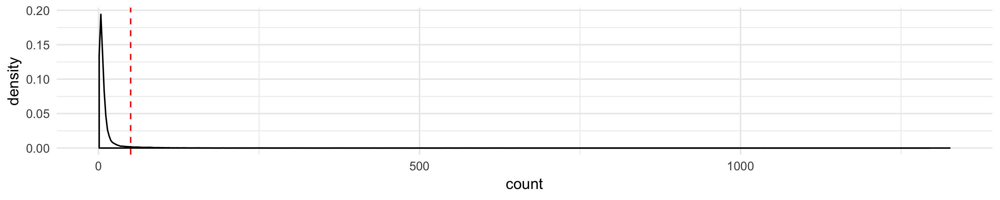

In [86]:
plot_density(patient_table, "count", lines = 50, height = 2)

In [87]:
print_count_and_proportion(sum(patient_table$count >= 50), nrow(patient_table))

[1] "797 over 21139 (3.77%)"

In [88]:
get_mutation_background_info <- function(mutation_key, threshold) {
    patients <- impact$patient_id[impact$mut_key == mutation_key]
    dd <- impact %>% filter(patient_id %in% patients) %>% group_by(patient_id) %>% summarise(count = n())
    
    ddr <- data.frame(unique(impact$Hugo_Symbol[impact$mut_key == mutation_key]),
                      unique(impact$HGVSp_Short[impact$mut_key == mutation_key]),
                      mutation_key, mean(dd$count),
                      length(patients),
                      sum(dd$count >= threshold),
                      sum(dd$count >= threshold) / length(patients))
    colnames(ddr) <- c("Hugo_Symbol", "HGVSp_Short", "mutation_key", "mean mutation count", "count", "hypermutated", "hypermutated_proportion")
    return (ddr)
}

dd <- data.frame()
for (i in 1:length(key))
    dd <- rbind(dd, get_mutation_background_info(key[i], 50))
dd

Hugo_Symbol,HGVSp_Short,mutation_key,mean mutation count,count,hypermutated,hypermutated_proportion
TP53,p.T125T,17_7579312_C_T,27.41176,36,7,0.19444444
TP53,p.T125T,17_7579312_C_A,15.68750,35,1,0.02857143
TP53,p.T125T,17_7579312_C_G,6.80000,5,0,0.00000000
HIST1H1C,p.A180A,6_26056117_C_T,32.88889,20,4,0.20000000
PTPRT,p.I395I,20_41101171_G_A,194.69231,16,8,0.50000000
PTPRT,p.T863T,20_40790142_C_T,111.18182,11,6,0.54545455
TP53,p.E224E,17_7578177_C_T,14.00000,11,1,0.09090909
BCL2,p.K22K,18_60985834_C_T,14.72727,11,0,0.00000000
BCL2,p.L23L,18_60985833_G_A,16.80000,10,0,0.00000000
PAK5,p.R600R,20_9525085_C_T,101.54545,11,8,0.72727273


Comparison with known oncogenic mutations:

In [89]:
dd <- data.frame()
for (mutation_key in unique(impact$mut_key[impact$oncogenic == "Oncogenic"]))
    dd <- rbind(dd, get_mutation_background_info(mutation_key, 50))

In [90]:
summary(dd$hypermutated_proportion)
summary(dd$hypermutated_proportion[dd$count >= 5])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.1662  0.1250  1.0000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.00000 0.03968 0.10567 0.16667 1.00000 

In [91]:
dd[dd$count >= 5 & dd$hypermutated_proportion == 1,]

,Hugo_Symbol,HGVSp_Short,mutation_key,mean mutation count,count,hypermutated,hypermutated_proportion
438,PIK3R1,p.R348*,5_67588951_C_T,275.8,10,10,1


## Summary

In [92]:
key <- c(
"17_7579312_C_T",
"17_7579312_C_A",
"17_7579312_C_G",
"6_26056117_C_T",
"20_41101171_G_A",
"20_40790142_C_T",
"17_7578177_C_T",
"18_60985834_C_T",
"18_60985833_G_A",
"20_9525085_C_T",
"21_39795342_G_A")

conservative_counts <- c(4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0)
cosmic_counts <- c(30, 37, 4, 8, 6, 0, 15, 13, 6, 0, 0)
remarks <- c("last exon base", "last exon base (see line above)", "last exon base (see line above)",
             "", "~ 30 bp from the end of the exon", "", "last exon base",
             "2 patients share this mutation and the one next line (one biallelic and the other on the same reads)", "", "", "~ 10 bp from the end of the exon")

In [93]:
number_unique_in_gene <- function(data, mutation_key, Hugo_Symbol, patient_id) {
    return (sum(sapply(unique(patient_id), function(x) nrow(data[data$patient_id == x &
                                                         data$Hugo_Symbol == Hugo_Symbol &
                                                         data$mut_key != mutation_key &
                                                         data$type != "synonymous",]) == 0)))
}

In [94]:
get_mutation_info <- function(data, mutation_key, conservative_count_, cosmic_count_, remark_, plots = FALSE) {
    selected_rows <- data[data$mut_key == mutation_key,]
    
    mutation <- selected_rows %>% summarise(count = sum(impact_unique_mut_keys_per_patient$mut_key[impact_unique_mut_keys_per_patient$type == "synonymous"] == mutation_key),
                                            conservative_count = count - conservative_count_,
                                            count_unique_in_gene = number_unique_in_gene(impact_unique_mut_keys_per_patient, mutation_key, unique(Hugo_Symbol), patient_id),
                                            mut_key = unique(mut_key),
                                            Hugo_Symbol = unique(Hugo_Symbol),
                                            gene_type = unique(gene_type),
                                            HGVSp_Short = toString(unique(HGVSp_Short)),
                                            cosmic_count = cosmic_count_,
                                            n_cancer_type = length(unique(selected_rows$cancer_type)),
                                            cancer_types = toString(unique(selected_rows$cancer_type)),
                                            remark = remark_)
    
    if (plots) {
        
        data$name <- "0_all dataset"
        data[data$mut_key == mutation_key,]$name <- mutation$mutation_key
        plot <- plot_density(data, "t_vaf", fill = "name", height = 2, adjust = 1/3) + theme(legend.position = "none") + ggtitle(paste(mutation$Hugo_Symbol, mutation$HGVSp_Short, mutation$mut_key, sep = " | ")) + theme(plot.title = element_text(size=10))
    }
   
    #browseURL(sprintf("https://cancer.sanger.ac.uk/cosmic/search?q=%s+%s", mutation$Hugo_Symbol, mutation$HGVSp_Short))
    
    if(plots)
        return (plot)
    return (mutation)
}

This table lists the real **synonymous mutations reccurent in more than 10 patients** over the IMPACT cohort (filtered by `Kaviar_AF < 0.001`). They all have the following properties:
* Clean reads
* Null or extremly low Kaviar AF and GnomAD AF
* Null frequency in normals

In [95]:
dd <- data.frame()

for (i in 1:length(key))
    dd <- rbind(dd, get_mutation_info(impact_syn, key[i], conservative_counts[i], cosmic_counts[i], remarks[i]))

dd

count,conservative_count,count_unique_in_gene,mut_key,Hugo_Symbol,gene_type,HGVSp_Short,cosmic_count,n_cancer_type,cancer_types,remark
34,30,14,17_7579312_C_T,TP53,tsg,p.T125T,30,19,"Soft Tissue, Uterus, Thyroid, Bladder, not_found, Brain, Cecum, Rectum, Unknown, Endometrium, Vulva, Ascending Colon, Lung, Anus, Colon, Pancreas, Small Bowel, Cancer of Unknown Primary, Gallbladder",last exon base
32,29,22,17_7579312_C_A,TP53,tsg,p.T125T,37,8,"Lung, not_found, -, Bladder, Uterus, Bone, Nose, Larynx",last exon base (see line above)
5,5,4,17_7579312_C_G,TP53,tsg,p.T125T,4,3,"Vagina, Brain, Lung",last exon base (see line above)
18,18,16,6_26056117_C_T,HIST1H1C,unknown,p.A180A,8,6,"Breast, Bladder, Lung, Unknown, Ovary, not_found",
13,13,2,20_41101171_G_A,PTPRT,tsg,p.I395I,6,5,"Skin, not_found, Unknown, Lung, Uterus",~ 30 bp from the end of the exon
11,11,4,20_40790142_C_T,PTPRT,tsg,p.T863T,0,4,"Skin, Cancer of Unknown Primary, Unknown, not_found",
11,11,8,17_7578177_C_T,TP53,tsg,p.E224E,15,6,"Scalp, GE Junction, not_found, Bladder, Uterus, Lung",last exon base
11,11,2,18_60985834_C_T,BCL2,oncogene,p.K22K,13,6,"Mediastinum, Lymph node, Abdomen, Neck, Mesentery, Skin",2 patients share this mutation and the one next line (one biallelic and the other on the same reads)
10,10,2,18_60985833_G_A,BCL2,oncogene,p.L23L,6,4,"Appendix, Lymph node, Skin, Neck",
11,11,4,20_9525085_C_T,PAK5,unknown,p.R600R,0,2,"Skin, Unknown",


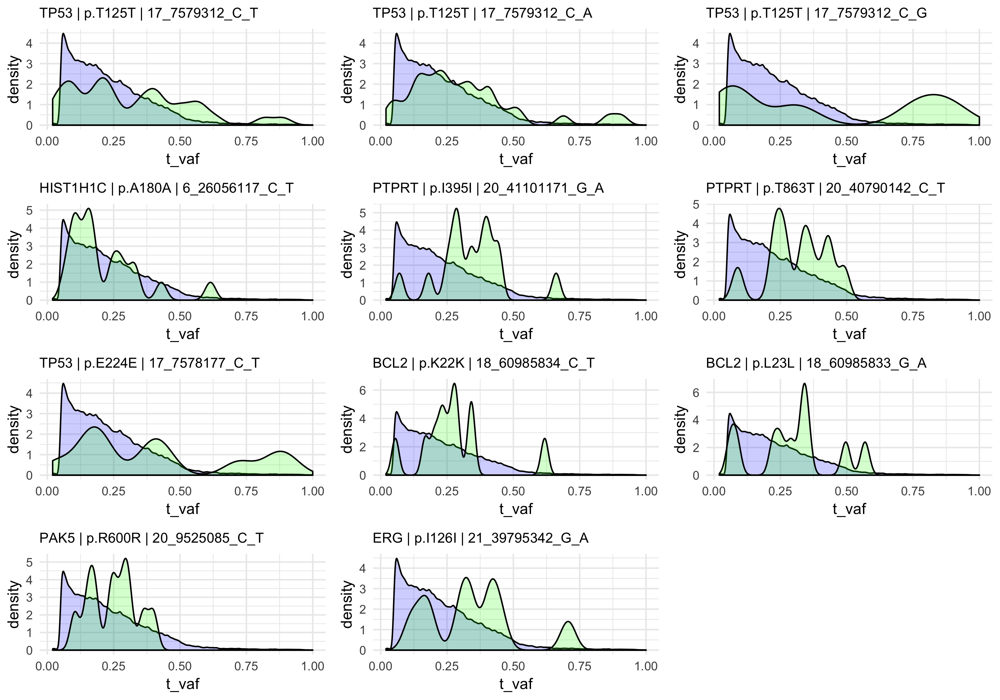

In [96]:
plots <- list()

for (i in 1:length(key))
    plots[[i]] <- get_mutation_info(impact_syn, key[i], conservative_counts[i], cosmic_counts[i], remarks[i], plots = TRUE)

notebook_plot_size(10, 7)
grid.arrange(grobs = plots, ncol = 3)